# <font color=steelblue>**Data Visualization with plotly**</font>

Although static visualizations are great and can be produced via `matplotlib` and `seaborn`, it is impossible for these graph to look at the smaller portion of the graph without creating another function. Hence, `plotly` is where interaction and animation are both possible. Although `plotly` required an online `plotly` account, an offline counterpart of `plotly` was created for people with no `plotly` accounts.

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import plotly
import plotly.tools as tls
import plotly.graph_objs as go
import matplotlib.pyplot as plt
plotly.offline.init_notebook_mode(connected=True)

## <font color=darkgreen>**Categorical dataset**</font>

In [14]:
data_map = pd.read_excel('example_map_coordinates.xlsx')
data_map.head()

,Temperature,x,y,Size,Age,Height,Discovered,Number of Cracks,Type
0,Cold,12.403793,29.235090,5,33,0.659565,Team B,3,Metamorphic
1,Cool,20.108971,23.261545,5,28,0.816170,Team B,2,Metamorphic
2,Hot,48.676685,19.513423,3,15,0.690910,Team A,0,Igneous
3,Cool,28.956447,20.543301,5,24,0.899220,Team B,2,Metamorphic
4,Cold,13.916281,26.081232,5,38,0.820272,Team B,3,Metamorphic


In [15]:
data_map['age_dec'] = data_map['Age'].map(lambda age: 10 * ((age // 10)))

In [16]:
temp_dict = {'Cold':'steelblue','Cool':'cornflowerblue','Lukewarm':'paleturquoise','Warm':'salmon','Hot':'orangered'}

In [17]:
data_map['color'] = data_map['Temperature'].apply(lambda l: temp_dict[l])

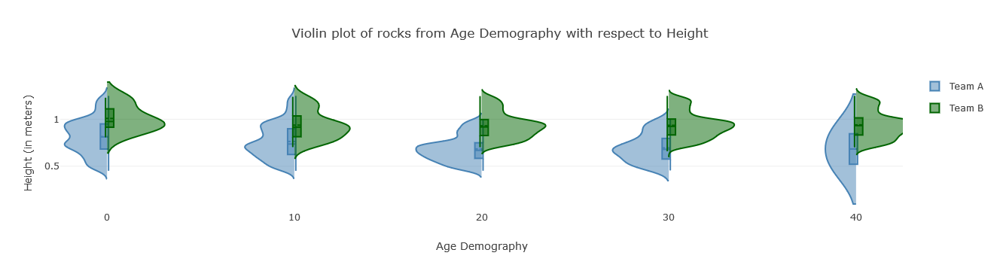

In [18]:
fig = {
    "data": [
        {
            "type": 'violin',
            "x": data_map['age_dec'] [data_map['Discovered'] == 'Team A' ],
            "y": data_map['Height'] [data_map['Discovered'] == 'Team A' ],
            "legendgroup": 'Yes',
            "scalegroup": 'Yes',
            "name": 'Team A',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'steelblue'
            }
        },
        {
            "type": 'violin',
            "x": data_map['age_dec'] [data_map['Discovered'] == 'Team B' ],
            "y": data_map['Height'] [data_map['Discovered'] == 'Team B' ],
            "legendgroup": 'No',
            "scalegroup": 'No',
            "name": 'Team B',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'darkgreen'
            }
        }
    ],
    "layout" : {
        'title':'Violin plot of rocks from Age Demography with respect to Height',
        'xaxis': {'title': 'Age Demography'},
        "yaxis": {
            "zeroline": True,'title': 'Height (in meters)'
},
        "violingap": 0,
        "violinmode": "overlay"
    }
}


plotly.offline.iplot(fig, filename = 'violin/split', validate = False)

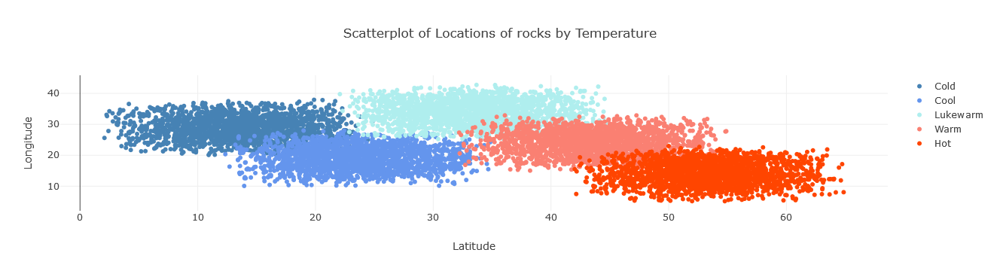

In [19]:
fig = {
    'data': [
        {
            'x': data_map[data_map['Temperature']==label]['x'],
            'y': data_map[data_map['Temperature']==label]['y'],
            'name': label, 
            'mode': 'markers',
            'marker': dict(color=data_map[data_map['Temperature']==label]['color']),
            'text': data_map[data_map['Temperature']==label]['Type']
        } for label in ['Cold','Cool','Lukewarm','Warm','Hot']
    ],
    'layout': {
        'title':'Scatterplot of Locations of rocks by Temperature',
        'xaxis': {'title': 'Latitude'},
        'yaxis': {'title': 'Longitude'}
    }
}

plotly.offline.iplot(fig, filename='pandas/grouped-scatter')

To create a 3D-surface plot, `linspace` and `meshgrid` would be used. The former divides an interval into smaller and equally-spaced intervals while the latter gets all formed pairs from the first and the second variables. also, one particular way of graphing plots from plotly is there is a separate variable for graphing the data and customizing it unlike in `matplotlib` and `seaborn` in which you would only append them.

In our example, we created a surface of a sphere where $x^2 + y^2 + z^2 = 2$

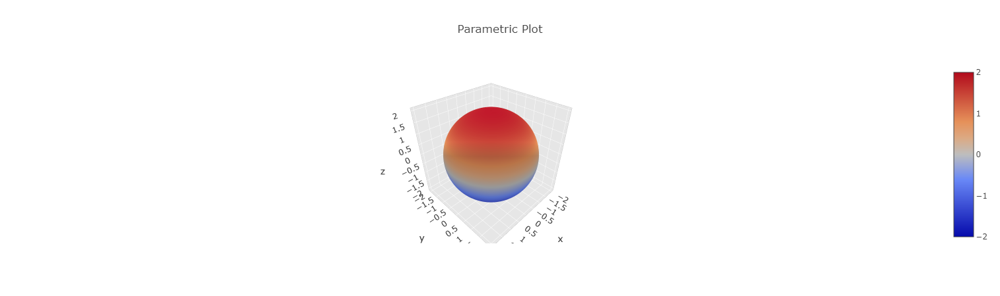

In [21]:
s = np.linspace(0, 2 * np.pi, 240)
t = np.linspace(0, np.pi, 240)
tGrid, sGrid = np.meshgrid(s, t)

r = 2
x = r * np.cos(sGrid) * np.sin(tGrid)  # x = r*cos(s)*sin(t)
y = r * np.sin(sGrid) * np.sin(tGrid)  # y = r*sin(s)*sin(t)
z = r * np.cos(tGrid)                  # z = r*cos(t)

surface = go.Surface(x=x, y=y, z=z)
data = [surface]

layout = go.Layout(
    title='Parametric Plot',
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        )
    )
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='jupyter-parametric_plot')

## <font color=darkgreen>**Time Series**</font>

In [22]:
ts_data = pd.read_excel('Time_Series_Example_Data.xlsx')
ts_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 4 columns):
Date    1000 non-null datetime64[ns]
TS_A    927 non-null float64
TS_B    921 non-null float64
TS_C    936 non-null float64
dtypes: datetime64[ns](1), float64(3)
memory usage: 31.3 KB


In [23]:
ts_data['Date'] = pd.to_datetime(ts_data['Date'],infer_datetime_format=True)

There are three ways to manipulate missing data. We could remove rows that have a `NaN`, however, it would decrease the number of datapoints we have, hence compromising the quality of analysis. On the other hand, we could replace it with a particular number but we are given a time series data and each value is affected by its previous value so we will use `forward fill` and `backward fill`. The former propagates last valid observation forward to next valid while the  latter uses next valid observation to fill gap ([pandas.DataFrame.fillna](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.fillna.html))

In [24]:
ts_data_ffill = ts_data.fillna(method='ffill')
ts_data_bfill = ts_data.fillna(method='bfill')

Then, we set the `Date` column as the index for the time series.

In [25]:
ts_data_ffill = ts_data_ffill.set_index("Date")
ts_data_bfill = ts_data_bfill.set_index("Date")

In [26]:
ts_data_ffill.head()

,TS_A,TS_B,TS_C
Date,,,
2016-01-01,16.0,37.0,28.0
2016-01-02,19.0,37.0,21.0
2016-01-03,16.0,34.0,22.0
2016-01-04,19.0,35.0,23.0
2016-01-05,20.0,35.0,25.0


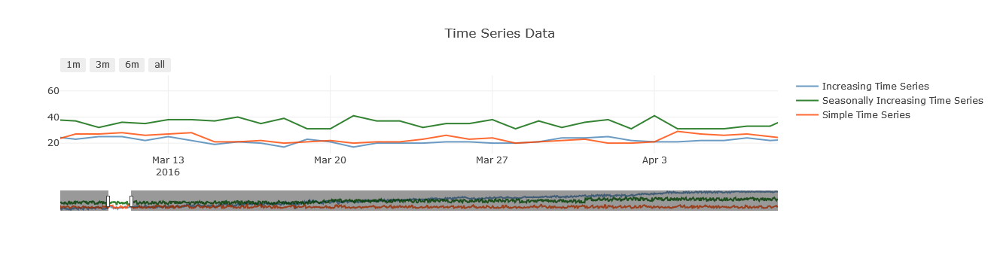

In [27]:
trace_a = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_A'],
    name = "Increasing Time Series",
    line = dict(color = 'steelblue'),
    opacity = 0.8)

trace_b = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_B'],
    name = "Seasonally Increasing Time Series",
    line = dict(color = 'darkgreen'),
    opacity = 0.8)

trace_c = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_C'],
    name = "Simple Time Series",
    line = dict(color = 'orangered'),
    opacity = 0.8)

data = [trace_a,trace_b,trace_c]

layout = dict(
    title='Time Series Data',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=3,
                     label='3m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig = dict(data=data, layout=layout)
plotly.offline.iplot(fig, filename = "Time Series with Rangeslider")

In [20]:
trace_a = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_A'].diff(),
    name = "First Differencing for Time Series A",
    line = dict(color = 'steelblue'),
    opacity = 0.8)

trace_b = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_C'].diff(),
    name = "First Differencing for Time Series C",
    line = dict(color = 'forestgreen'),
    opacity = 0.8)

trace_c = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_A'].rolling(7, center=True).mean(),
    name = "One-Week rolling mean for Time Series A",
    line = dict(color = 'skyblue'),
    opacity = 0.8)

trace_d = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_C'].rolling(7, center=True).mean(),
    name = "One-Week rolling mean for Time Series C",
    line = dict(color = 'limegreen'),
    opacity = 0.8)

trace_e = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_A'].rolling(7, center=True).std(),
    name = "One-week rolling standard deviation for Time Series A",
    line = dict(color = 'powderblue'),
    opacity = 0.8)

trace_f = go.Scatter(
    x=ts_data_ffill.index,
    y=ts_data_ffill['TS_C'].rolling(7, center=True).std(),
    name = "One-week rolling standard deviation for Time Series C",
    line = dict(color = 'palegreen'),
    opacity = 0.8)

data = [trace_a,trace_b,trace_c,trace_d,trace_e,trace_f]

layout = dict(
    title='Time Series Data',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=3,
                     label='3m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig = dict(data=data, layout=layout)
plotly.offline.iplot(fig, filename = "Time Series with Rangeslider")

NameError: name 'ts_data_ffill' is not defined

## <font color=steelblue>**Summary of Data Visualization tools**</font>

Characteristics|matplotlib|seaborn|plotly
--|--|--|--
Best suited for | basic plots and subplots | scatter plots with distinct labels | time series data
User-friendly visualization | No | Yes | Yes
Color-scheme friendly | Yes | Yes | No
Interactive | No | No | Yes
Requirements for graphing of data | one line of code | one line of code | trace
Requirements for layout of data | series of customization | series of customization | dictionary
Automatic change of y-axis range | No | No | Yes
Limitations | lacks interactivity and fewer suitable graphs | lacks interactivity | must have extensive knowledge of color names and requires being an account to save files